Introduction
The following document includes some exploratory data analysis for a few data sets downloaded from the FIA datamart in order to further narrow down our project plan. Each data set will have a brief summary after the EDA has been performed in this notebook. Then as a conclusion, certian datasets will be selected for the project and the project plan will be narrowed.
The .XLSM sheet attached in this folder could be useful as overall totals but that's about it.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
sns.set_style("whitegrid")

### **WA_SEEDLING_REGEN** 

In [4]:
seedling_regen_data = pd.read_csv("../Data/WA_SEEDLING_REGEN.csv")
seedling_regen_data.head()

,CN,PLT_CN,CND_CN,SCD_CN,INVYR,STATECD,UNITCD,COUNTYCD,PLOT,SUBP,...,SPCD,SPGRPCD,SEEDLING_SOURCE_CD,LENGTH_CLASS_CD,SEEDLINGCOUNT,CREATED_DATE,MODIFIED_DATE,CYCLE,SUBCYCLE,TPA_UNADJ


#### Conclusion for **WA_SEEDLING_REGEN** 
The seedling regen data, which would have been super useful appears to be empty. Two download attempts resulted in a 186B file which was just headers. It would be worth reaching out to the USFS regarding this empty data not only for ourselves but also future projects with this data.

### **WA_TREE_REGIONAL_BIOMASS** 

In [5]:
wa_biomass_tree = pd.read_csv('../Data/WA_TREE_REGIONAL_BIOMASS.csv')
wa_plot_data = pd.read_csv('../Data/WA_PLOT.csv')

In [6]:
wa_biomass_tree.sample(6)

,TRE_CN,STATECD,REGIONAL_DRYBIOT,REGIONAL_DRYBIOM,CREATED_BY,CREATED_DATE,CREATED_IN_INSTANCE,MODIFIED_BY,MODIFIED_DATE,MODIFIED_IN_INSTANCE,REGIONAL_DRYBIOSL
156053,22429428010497,53,1121.093027,781.352105,NIMS_30,2008-01-24 20:49:58,10497,FSJFIRMAN,2020-07-17 21:11:49,290487,756.329680
335629,720666977290487,53,252.678875,136.510539,FSJASONBROWN,2020-02-11 14:24:01,290487,FSJFIRMAN,2020-07-20 21:12:32,290487,NaN
332769,302293914489998,53,127.473564,57.597112,RWANEK,2015-02-17 12:58:58,489998,FSJFIRMAN,2020-07-20 21:12:01,290487,NaN
177849,24843461010900,53,222.186896,129.351726,NIMS_40,2009-05-29 15:31:20,10902,FSJFIRMAN,2020-07-17 21:11:32,290487,NaN
170565,8609231010901,53,12314.959096,8084.259971,NIMS_30,2007-04-30 15:08:49,10901,FSJFIRMAN,2020-07-17 21:37:21,290487,8027.659939
196290,22421826010497,53,85.916005,34.476530,NIMS_30,2008-01-25 11:27:08,10497,FSJFIRMAN,2020-07-17 21:11:47,290487,NaN


In [7]:
wa_biomass_tree.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 451848 entries, 0 to 451847
Data columns (total 11 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   TRE_CN                451848 non-null  int64  
 1   STATECD               451848 non-null  int64  
 2   REGIONAL_DRYBIOT      405016 non-null  float64
 3   REGIONAL_DRYBIOM      381251 non-null  float64
 4   CREATED_BY            451848 non-null  object 
 5   CREATED_DATE          451848 non-null  object 
 6   CREATED_IN_INSTANCE   451848 non-null  int64  
 7   MODIFIED_BY           451848 non-null  object 
 8   MODIFIED_DATE         451848 non-null  object 
 9   MODIFIED_IN_INSTANCE  451848 non-null  int64  
 10  REGIONAL_DRYBIOSL     165672 non-null  float64
dtypes: float64(3), int64(4), object(4)
memory usage: 37.9+ MB


Looks like REGIONAL_DRYBIOM and REGIONAL_DRYBIOSL both have a fair number of missing values, (70597 and 286176 respectively). Depending on the significace of each of these, if needed we could throw out the latter.

#### EDA on Biomass
Can't hurt to do some basic EDA on the Biomass Dataset. So we begin with dropping the null values and seeing what we can or cannot get. Mapping this data will likely also come in handy. 

In [9]:
new_biomass = wa_biomass_tree.dropna()
new_biomass.info()

<class 'pandas.core.frame.DataFrame'>
Index: 165672 entries, 0 to 451847
Data columns (total 11 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   TRE_CN                165672 non-null  int64  
 1   STATECD               165672 non-null  int64  
 2   REGIONAL_DRYBIOT      165672 non-null  float64
 3   REGIONAL_DRYBIOM      165672 non-null  float64
 4   CREATED_BY            165672 non-null  object 
 5   CREATED_DATE          165672 non-null  object 
 6   CREATED_IN_INSTANCE   165672 non-null  int64  
 7   MODIFIED_BY           165672 non-null  object 
 8   MODIFIED_DATE         165672 non-null  object 
 9   MODIFIED_IN_INSTANCE  165672 non-null  int64  
 10  REGIONAL_DRYBIOSL     165672 non-null  float64
dtypes: float64(3), int64(4), object(4)
memory usage: 15.2+ MB


Removing null ROWS takes us to a 165672 entries in 10 columns. Also takes the dataset from 37.9MB to 15.2MB (roughly halves.) 

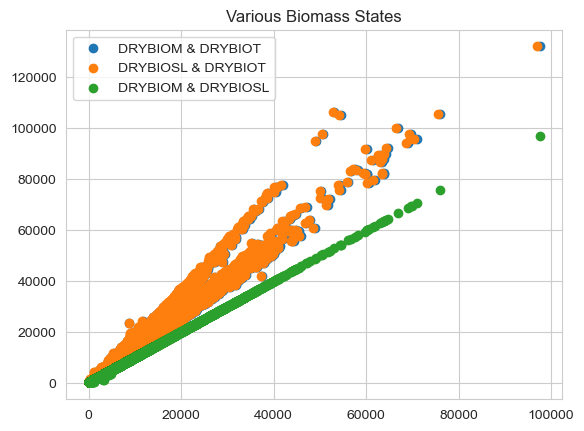

In [10]:
plt.scatter(new_biomass['REGIONAL_DRYBIOM'], new_biomass['REGIONAL_DRYBIOT'], label = "DRYBIOM & DRYBIOT")
plt.scatter(new_biomass['REGIONAL_DRYBIOSL'], new_biomass['REGIONAL_DRYBIOT'], label = 'DRYBIOSL & DRYBIOT')
plt.scatter(new_biomass['REGIONAL_DRYBIOM'], new_biomass['REGIONAL_DRYBIOSL'], label = 'DRYBIOM & DRYBIOSL')
plt.title('Various Biomass States')
plt.legend()
plt.show()

There's certianly a linear relationship here, if not a few. It could be worth determining each of these by region and investigating if each of these relationships is regionally independent. Additionally it seems as if DRYBIOM and DRYBIOSL are perfectly linear and the relationships between DRYBIOM/DRYBIOSL and DRYBIOT are remarkably similar. This means that that, with the information we could easily use the data from DRYBIOM rather than DRYBIOSL and get similar outcomes. This saves us from having to remove over half the data.

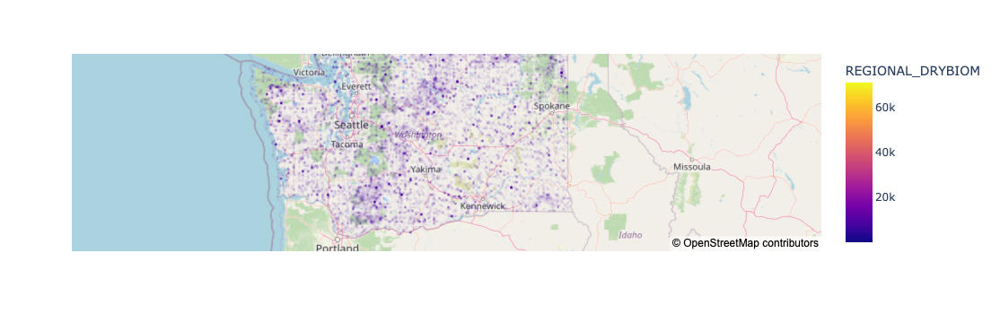

In [11]:
fig = px.density_mapbox(new_biomass.iloc[:22083,:], lat=wa_plot_data['LAT'], lon=wa_plot_data['LON'], z='REGIONAL_DRYBIOM', radius=2,
                        center=dict(lat=47, lon=-120), zoom=5,
                        mapbox_style="open-street-map")
fig.show()

Plot of the regional DRYBIOM against lat and lon from the WA_PLOT dataset. This data could be wildly skewed given that the WA_PLOT datset contains only 22083 lat and lon entries and the REGIONAL_DRYBIOM has 451000+ entries. To make this plot I simply took a splice of the first 22083 from REGIONAL_DRYBIOM which may not align at all with this map. This is why we don't see as much variabilty in the biomass, even though we know it's there from the previous plot. 

#### Conclusion for **WA_TREE_REGIONAL_BIOMASS** 
In order to fully use the Biomass data set, we'd either need to take a random sample of 22083 points, OR sort the set by region using some other classifer in the set, such as some sort of County code. More understanding of the column names is needed with this Biomass dataset. It's not completely clear what each represents. Not so sure how useful this is to us. Getting this data to all align is going to be hard.
#### UPDATE: Biomass is very broad and has many definitions so we decided not to move forward with this.

### **WA_SOIL_LAB** 

In [16]:
soil_data = pd.read_csv("../Data/WA_SOILS_LAB.csv")
soil_data.head(5)

,CN,PLT_CN,INVYR,STATECD,COUNTYCD,PLOT,SMPLNNBR,VSTNBR,LAYER_TYPE,SAMPLER_TYPE,...,EXCHNG_CU,EXCHNG_ZN,EXCHNG_CD,EXCHNG_PB,EXCHNG_S,BRAY1_P,OLSEN_P,MEASYEAR,MODIFIED_DATE,CREATED_DATE
0,29198811010900,24511125010900,2003,53,7,87942,2,1.0,FF_TOTAL,SF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2003,2018-02-23 20:56:54,2008-05-14 15:09:13
1,29198813010900,24511125010900,2003,53,7,87942,2,1.0,MIN_1,BD,...,0.0,0.50,0.00,0.53,0.00,273.00,NaN,2003,2018-02-23 20:56:54,2008-05-14 15:09:13
2,29198814010900,24511125010900,2003,53,7,87942,2,1.0,MIN_2,BD,...,0.0,0.12,-0.02,0.14,9.39,130.57,NaN,2003,2018-02-23 20:56:54,2008-05-14 15:09:13
3,29198812010900,24511125010900,2003,53,7,87942,3,1.0,FF_TOTAL,SF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2003,2018-02-23 20:56:54,2008-05-14 15:09:13
4,29198807010900,24515062010900,2003,53,9,62049,2,1.0,FF_TOTAL,SF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2003,2018-02-23 20:56:54,2008-05-14 15:09:13


In [17]:
soil_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 290 entries, 0 to 289
Data columns (total 47 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   CN                             290 non-null    int64  
 1   PLT_CN                         290 non-null    int64  
 2   INVYR                          290 non-null    int64  
 3   STATECD                        290 non-null    int64  
 4   COUNTYCD                       290 non-null    int64  
 5   PLOT                           290 non-null    int64  
 6   SMPLNNBR                       290 non-null    int64  
 7   VSTNBR                         280 non-null    float64
 8   LAYER_TYPE                     290 non-null    object 
 9   SAMPLER_TYPE                   290 non-null    object 
 10  QASTATCD                       290 non-null    int64  
 11  SAMPLE_DATE                    290 non-null    object 
 12  LAB_ID                         290 non-null    obj

It looks like we only have less than half of the data for carbon, pH, and other metals. Before dropping them, let's do some eda with water percentage.

In [18]:
new_soil=soil_data.dropna(subset=['EXCHNG_FE'])
new_soil.info()

<class 'pandas.core.frame.DataFrame'>
Index: 105 entries, 1 to 288
Data columns (total 47 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   CN                             105 non-null    int64  
 1   PLT_CN                         105 non-null    int64  
 2   INVYR                          105 non-null    int64  
 3   STATECD                        105 non-null    int64  
 4   COUNTYCD                       105 non-null    int64  
 5   PLOT                           105 non-null    int64  
 6   SMPLNNBR                       105 non-null    int64  
 7   VSTNBR                         101 non-null    float64
 8   LAYER_TYPE                     105 non-null    object 
 9   SAMPLER_TYPE                   105 non-null    object 
 10  QASTATCD                       105 non-null    int64  
 11  SAMPLE_DATE                    105 non-null    object 
 12  LAB_ID                         105 non-null    object 


Looks good. Now let's do some EDA.

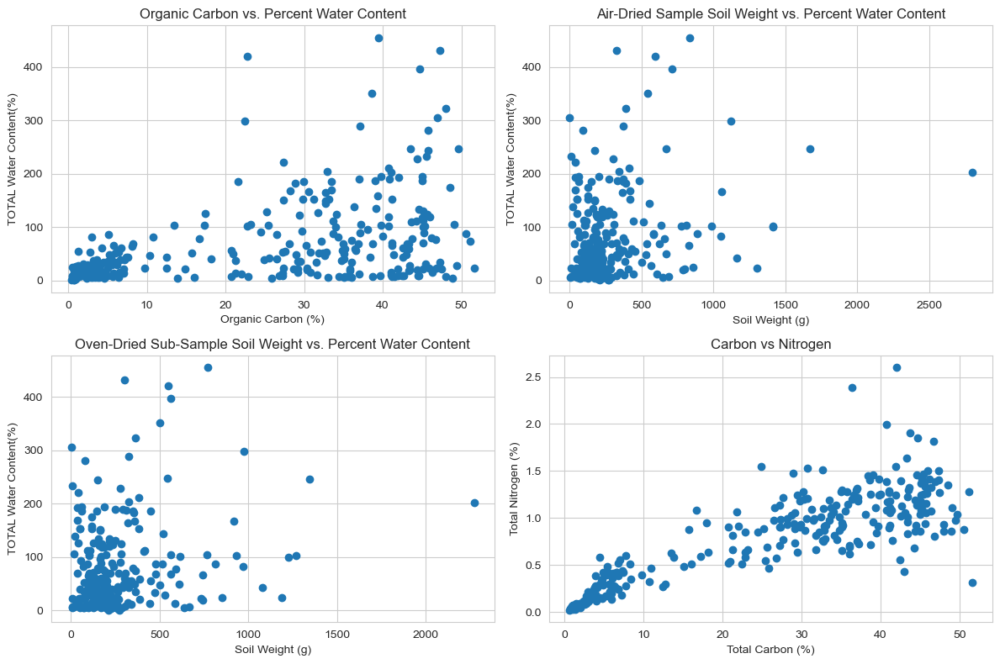

In [19]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8))  
axs = np.ravel(axs)

axs[0].scatter(soil_data['C_ORG_PCT'], soil_data['TOTAL_WATER_CONTENT_PCT'])
axs[0].set_title('Organic Carbon vs. Percent Water Content')  
axs[0].set_xlabel('Organic Carbon (%)')  # Label for X-axis
axs[0].set_ylabel('TOTAL Water Content(%)')  # Label for Y-axis

axs[1].scatter(soil_data['AIR_DRY_SOIL_WT'], soil_data['TOTAL_WATER_CONTENT_PCT'])
axs[1].set_title('Air-Dried Sample Soil Weight vs. Percent Water Content')  
axs[1].set_xlabel('Soil Weight (g)')  # Label for X-axis
axs[1].set_ylabel('TOTAL Water Content(%)')  # Label for Y-axis

axs[2].scatter(soil_data['OVEN_DRY_SOIL_WT'], soil_data['TOTAL_WATER_CONTENT_PCT'])
axs[2].set_title('Oven-Dried Sub-Sample Soil Weight vs. Percent Water Content')  
axs[2].set_xlabel('Soil Weight (g)')  # Label for X-axis
axs[2].set_ylabel('TOTAL Water Content(%)')  # Label for Y-axis

axs[3].scatter(soil_data['C_TOTAL_PCT'], soil_data['N_TOTAL_PCT'])
axs[3].set_title('Carbon vs Nitrogen')  
axs[3].set_xlabel('Total Carbon (%)')  # Label for X-axis
axs[3].set_ylabel('Total Nitrogen (%)')  # Label for Y-axis
plt.tight_layout()

plt.show()

Relationship between carbon and nitrogen which makes sense since the carbon-nitrogen ratio is very important! Seems like ideal carbon-nitrogen ratio is 10:1 to 20:1. 

Let's look at distribution of soil weight and percent water content

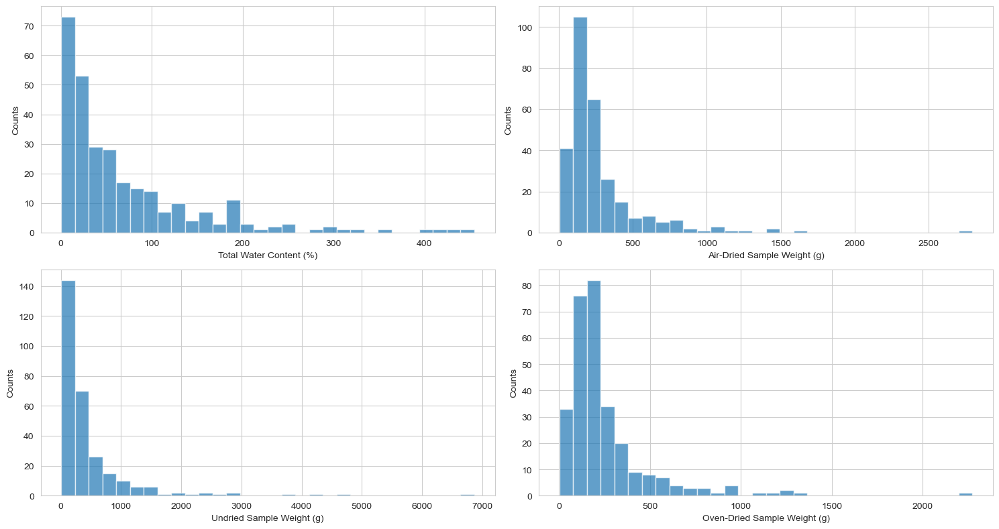

In [20]:
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = np.ravel(axs)

axs[0].hist(soil_data['TOTAL_WATER_CONTENT_PCT'], bins=30, alpha=0.7)  
axs[0].set_xlabel('Total Water Content (%)')  # Label for X-axis
axs[0].set_ylabel('Counts')  # Label for Y-axis

axs[1].hist(soil_data['AIR_DRY_SOIL_WT'], bins=30, alpha=0.7)  
axs[1].set_xlabel('Air-Dried Sample Weight (g)')  # Label for X-axis
axs[1].set_ylabel('Counts')  # Label for Y-axis

axs[2].hist(soil_data['FIELD_MOIST_SOIL_WT'], bins=30, alpha=0.7)  
axs[2].set_xlabel('Undried Sample Weight (g)')  # Label for X-axis
axs[2].set_ylabel('Counts')  # Label for Y-axis

axs[3].hist(soil_data['OVEN_DRY_SOIL_WT'], bins=30, alpha=0.7)  
axs[3].set_xlabel('Oven-Dried Sample Weight (g)')  # Label for X-axis
axs[3].set_ylabel('Counts')  # Label for Y-axis

plt.tight_layout()

plt.show()

Seems to be some outliers as expected in these types of datasets. 

#### Conclusion for **WA_SOIL_LAB**: 
Overall there is not a lot of data to work with here. 290 samples will not be enough likely. 
#### UPDATE: We did not move forward with this due to the data availability problem.

### **WA_TREE**

In [23]:
wa_tree_data = pd.read_csv("../Data/WA_TREE.csv")

/var/folders/rd/2pn3c7gx2_9_cbdrsq0k0r6r0000gn/T/ipykernel_38821/2346177136.py:1: DtypeWarning:

Columns (77,159) have mixed types. Specify dtype option on import or set low_memory=False.



In [24]:
wa_tree_data.head(5)

,CN,PLT_CN,PREV_TRE_CN,INVYR,STATECD,UNITCD,COUNTYCD,PLOT,SUBP,TREE,...,VOLCSNET_BARK,DRYBIO_STEM,DRYBIO_STEM_BARK,DRYBIO_STUMP_BARK,DRYBIO_BOLE_BARK,DRYBIO_BRANCH,DRYBIO_FOLIAGE,DRYBIO_SAWLOG_BARK,PREV_ACTUALHT_FLD,PREV_HT_FLD
0,4871760,21864,NaN,2001,53,5,29,11,2,4871760,...,NaN,NaN,NaN,1.214989,20.690842,NaN,NaN,NaN,NaN,NaN
1,4871761,21864,NaN,2001,53,5,29,11,2,4871761,...,NaN,NaN,NaN,13.674053,343.282859,NaN,NaN,NaN,NaN,NaN
2,4879506,21864,NaN,2001,53,5,29,11,2,4879506,...,NaN,NaN,NaN,19.433360,738.157808,NaN,NaN,NaN,NaN,NaN
3,4871762,21865,NaN,2001,53,5,29,15,1,4871762,...,NaN,NaN,NaN,9.565398,204.506428,NaN,NaN,NaN,NaN,NaN
4,4871763,21865,NaN,2001,53,5,29,15,1,4871763,...,NaN,NaN,NaN,20.594949,530.372513,NaN,NaN,NaN,NaN,NaN


#### Crown Data Analysis
Let's look at the crown components since crown size is big component of tree health.<br>
'CR': compacted crown ratio( determined by dividing amount of tree bole supporting healthy foliage by actual tree length) <br>
'UNCRCD': uncompacted live crown ratio (determined by dividing the live crown length bythe actual tree length)<br>
'CPOSCD': crown position code (1 for superstory, 2 for overstory, 3 for understory, and 4 for open canopy)<br>
'CLIGHTCD': crown light exposure code (0 for no direct sunlight, 1-5 is full light light to top and/or various sides)<br>
'CVIGORCD': crown vigor code (looks at sapling crowns 1 - 3 where 1 is largest uncompacted live crown ratio)<br>
'CDENCD': crown density code ( 00, 05,10,15... up to 99 where each code repressents a percentage of density where density is the amount of things that block light visibility through the crown)<br>
'CDIEBKCD': crown dieback code ( code indicating amount of recent dead material in crown, same codes as CDENCD)<br>
'TRANSCD':foliage transparency code ( code indicating amount of light penetrating foliated portion of the crown, estimated in same percent classes as CDENCD)

In [25]:
print(f'Non-NA Count for CVIGORCD is {wa_tree_data['CVIGORCD'].count()}')
print(f'Non-NA Count for UNCRCD is {wa_tree_data['UNCRCD'].count()}')
print(f'Non-NA Count for CR is {wa_tree_data['CR'].count()}')
print(f'Non-NA Count for CPOSCD is {wa_tree_data['CPOSCD'].count()}')
print(f'Non-NA Count for CLIGHTCD is {wa_tree_data['CLIGHTCD'].count()}')
print(f'Non-NA Count for CDENCD is {wa_tree_data['CDENCD'].count()}')
print(f'Non-NA Count for CDIEBKCD is {wa_tree_data['CDIEBKCD'].count()}')
print(f'Non-NA Count for TRANSCD is {wa_tree_data['TRANSCD'].count()}')

Non-NA Count for CVIGORCD is 586
Non-NA Count for UNCRCD is 5524
Non-NA Count for CR is 390859
Non-NA Count for CPOSCD is 5524
Non-NA Count for CLIGHTCD is 5524
Non-NA Count for CDENCD is 4938
Non-NA Count for CDIEBKCD is 4938
Non-NA Count for TRANSCD is 4938


In [26]:
wa_tree_data_Crown=wa_tree_data.dropna(subset=['UNCRCD','CDENCD','TRANSCD','CLIGHTCD','CDIEBKCD','CR'])
wa_tree_data_Crown['CDENCD'].info()

<class 'pandas.core.series.Series'>
Index: 4938 entries, 14277 to 213832
Series name: CDENCD
Non-Null Count  Dtype  
--------------  -----  
4938 non-null   float64
dtypes: float64(1)
memory usage: 77.2 KB


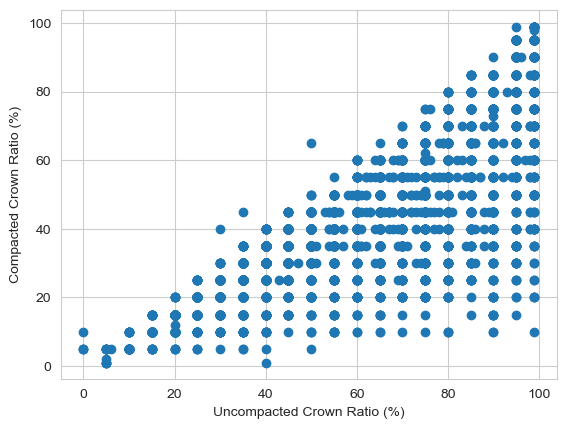

In [27]:
plt.scatter(wa_tree_data_Crown['UNCRCD'],wa_tree_data_Crown['CR'])
plt.xlabel('Uncompacted Crown Ratio (%)')
plt.ylabel('Compacted Crown Ratio (%)')

plt.show()

negative correlation between compacted and uncompacted crown ratios as expected

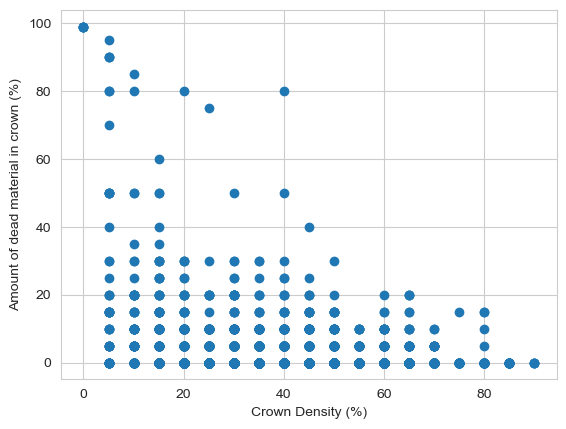

In [28]:
plt.scatter(wa_tree_data_Crown['CDENCD'],wa_tree_data_Crown['CDIEBKCD'])
plt.xlabel('Crown Density (%)')
plt.ylabel('Amount of dead material in crown (%)')

plt.show()

Interestingly, as crown density increases, the amount of dead material in crown decreases. Crown density is measured as the amount of things that block light such as crown branches,foliage, and reproductive structures.

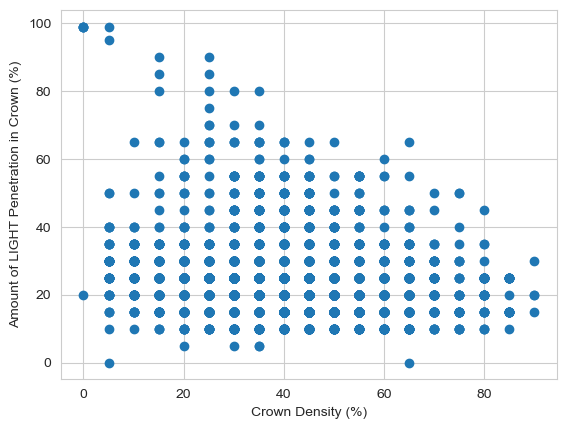

In [29]:
plt.scatter(wa_tree_data_Crown['CDENCD'],wa_tree_data_Crown['TRANSCD'])
plt.xlabel('Crown Density (%)')
plt.ylabel('Amount of LIGHT Penetration in Crown (%)')

plt.show()

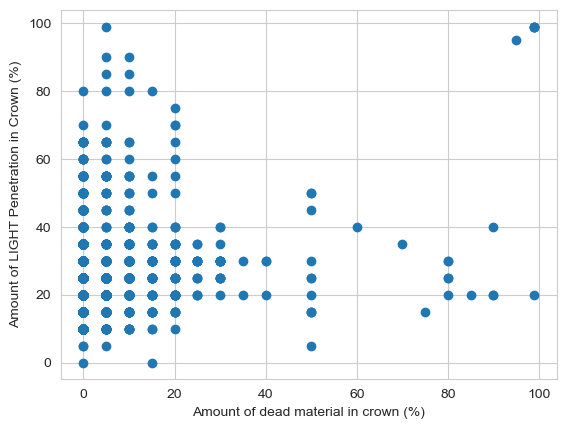

In [30]:
plt.scatter(wa_tree_data_Crown['CDIEBKCD'],wa_tree_data_Crown['TRANSCD'])
plt.xlabel('Amount of dead material in crown (%)')
plt.ylabel('Amount of LIGHT Penetration in Crown (%)')

plt.show()

#### Damage Data
'Cull': rotten and missing cull (percent of the cubic foot volume in a live or dead tally tree that is rotten or missing) <br>
'DecayCD': Decay class code (code indicating stage of decay in a standing dead tree) <br>
There are also columns for first degree damage and secondary damage. <br>
'DAMLOC1': code indicating where damage is present on tree, 0-9 where 0 is no damage and 9 is foliage damage (ref field guide for how decide if there is damage) <br>
'DAMTYP1': code indicating kind of damage present(01 to 31)<br>
'DAMSEV1': code indicating how much of tree is affected, 0 to 9 where 0 is 1-9% affected, and 9 is 90 to 99% affected<br>
'DAMLOC2': "" but for secondary damage<br>
'DAMTYP2':<br>
'DAMSEV2':<br>

In [32]:
print(f'Non-NA Count for CULL is {wa_tree_data['CULL'].count()}')
print(f'Non-NA Count for DECAYCD is {wa_tree_data['DECAYCD'].count()}')
print(f'Non-NA Count for DAMLOC1 is {wa_tree_data['DAMLOC1'].count()}')
print(f'Non-NA Count for DAMTYP1 is {wa_tree_data['DAMTYP1'].count()}')
print(f'Non-NA Count for DAMSEV1 is {wa_tree_data['DAMSEV1'].count()}')
print(f'Non-NA Count for DAMLOC2 is {wa_tree_data['DAMLOC2'].count()}')
print(f'Non-NA Count for DAMTYP2 is {wa_tree_data['DAMTYP2'].count()}')
print(f'Non-NA Count for DAMSEV2 is {wa_tree_data['DAMSEV2'].count()}')
print(f'Non-NA Count for DAMAGE_AGENT_CD1 is {wa_tree_data['DAMAGE_AGENT_CD1'].count()}')

Non-NA Count for CULL is 397054
Non-NA Count for DECAYCD is 73275
Non-NA Count for DAMLOC1 is 94022
Non-NA Count for DAMTYP1 is 1835
Non-NA Count for DAMSEV1 is 1835
Non-NA Count for DAMLOC2 is 26918
Non-NA Count for DAMTYP2 is 282
Non-NA Count for DAMSEV2 is 282
Non-NA Count for DAMAGE_AGENT_CD1 is 168479


We have a lot of data for cull but little for decay. Still let's do some EDA. Still not quite sure what is different between the 1st and secondary damage.

In [33]:
wa_tree_data_damage=wa_tree_data.dropna(subset=['CULL','DECAYCD'])
wa_tree_data_damage['CULL'].info()

<class 'pandas.core.series.Series'>
Index: 44417 entries, 84621 to 504953
Series name: CULL
Non-Null Count  Dtype  
--------------  -----  
44417 non-null  float64
dtypes: float64(1)
memory usage: 694.0 KB


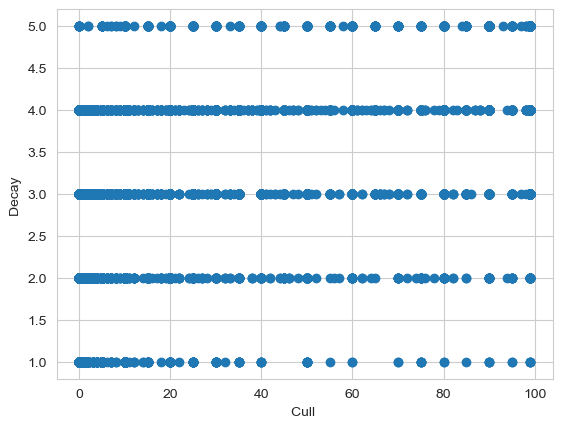

In [34]:
plt.scatter(wa_tree_data_damage['CULL'],wa_tree_data_damage['DECAYCD'])
plt.xlabel('Cull ')
plt.ylabel('Decay ')

plt.show()

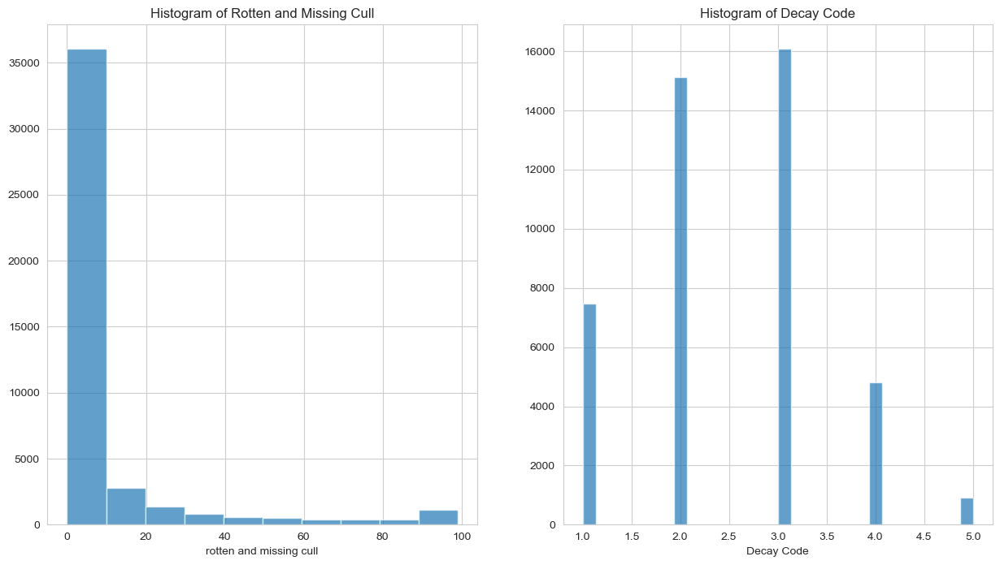

In [54]:
fig, ax = plt.subplots(1, 2, figsize=(15, 8))
ax = np.ravel(ax)
ax[0].hist(wa_tree_data_damage['CULL'], bins=10, alpha=0.7) 
ax[0].set_xlabel('rotten and missing cull')
ax[0].set_title('Histogram of Rotten and Missing Cull')

ax[1].hist(wa_tree_data_damage['DECAYCD'], bins=30, alpha=0.7) 
ax[1].set_xlabel('Decay Code')
ax[1].set_title('Histogram of Decay Code')

plt.show()

It would be interesting comparing this damage data to the fire data we have. Now let's look at how many trees have been damaged due to a fire.

In [38]:
trees_damage_fire= wa_tree_data[(wa_tree_data['DAMAGE_AGENT_CD1']==30000) | (wa_tree_data['DAMAGE_AGENT_CD2']==30000) |(wa_tree_data['DAMAGE_AGENT_CD3']==30000)]

In [39]:
trees_damage_fire.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1562 entries, 267343 to 504010
Columns: 197 entries, CN to PREV_HT_FLD
dtypes: float64(180), int64(13), object(4)
memory usage: 2.4+ MB


In [42]:
trees_damage_fire['INVYR'].head()

267343    2013
269357    2013
269359    2013
269360    2013
269380    2013
Name: INVYR, dtype: int64

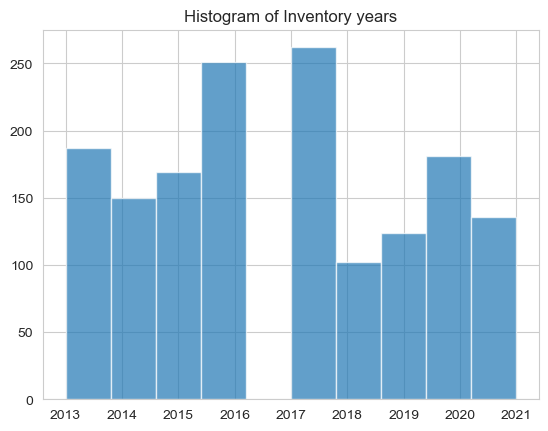

In [55]:
plt.hist(trees_damage_fire['INVYR'], bins=10, alpha=0.7) 
plt.title('Histogram of Inventory years')
plt.show()

*IDEAS*

Once we can cross reference with fire data, we could look at how long the fire damage persists after a fire by referencing sampling dates IN 'MEASYEAR', 'MEASMO','MEASDAY', found in plot table as trees table does not have measyear.
Looks like measurements were done up until 2023.



Now let's look at how many trees are dead/alive

StatusCd = 
- 0:no status (tree not presently in sample?)
- 1: live tree?
- 2: dead tree
- 3: removed (tree removed by humans)

In [45]:
# Keep some other relevant columns to see how much data we have
WA_Tree_Health=wa_tree_data[['CN','PLT_CN','PREV_TRE_CN','INVYR','STATUSCD','TPA_UNADJ','STOCKING','HT','DIA','CR','BHAGE','CDENCD','CULL_FLD']]

In [46]:
WA_Tree_Health.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 504956 entries, 0 to 504955
Data columns (total 13 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   CN           504956 non-null  int64  
 1   PLT_CN       504956 non-null  int64  
 2   PREV_TRE_CN  224226 non-null  float64
 3   INVYR        504956 non-null  int64  
 4   STATUSCD     504956 non-null  int64  
 5   TPA_UNADJ    464142 non-null  float64
 6   STOCKING     389940 non-null  float64
 7   HT           464134 non-null  float64
 8   DIA          464134 non-null  float64
 9   CR           390859 non-null  float64
 10  BHAGE        113770 non-null  float64
 11  CDENCD       4938 non-null    float64
 12  CULL_FLD     384455 non-null  float64
dtypes: float64(9), int64(4)
memory usage: 50.1 MB


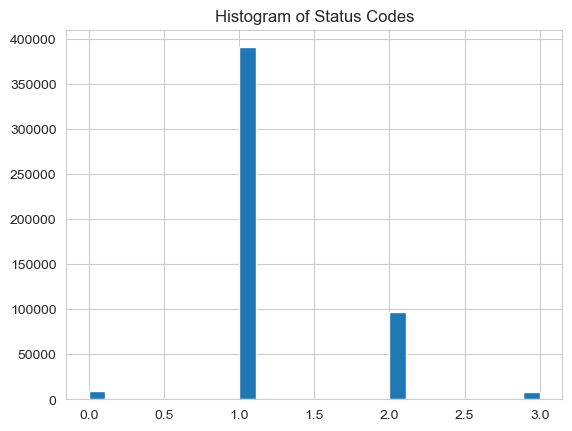

In [56]:
plt.hist(WA_Tree_Health['STATUSCD'],bins=27)
plt.title('Histogram of Status Codes')
plt.show()

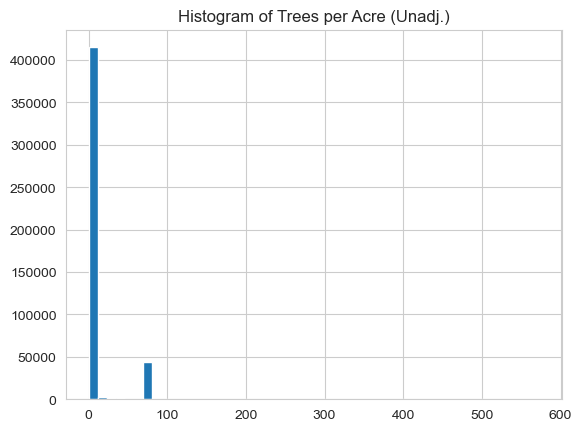

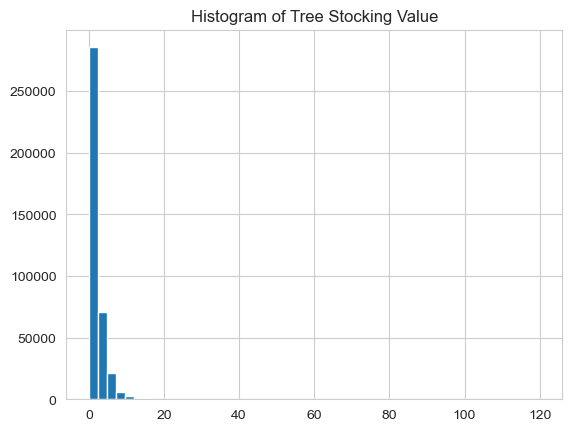

In [57]:
plt.hist(WA_Tree_Health['TPA_UNADJ'],bins=50)
plt.title('Histogram of Trees per Acre (Unadj.)')
plt.show()

plt.hist(WA_Tree_Health['STOCKING'],bins=50)
plt.title('Histogram of Tree Stocking Value')
plt.show()

#### Conclusion for **WA_TREE**:
This will be the dataset we end up using as it has a lot of different indicators we could use to predict forest health

### **WA_PLOT**

<class 'pandas.core.series.Series'>
RangeIndex: 22083 entries, 0 to 22082
Series name: MEASYEAR
Non-Null Count  Dtype
--------------  -----
22083 non-null  int64
dtypes: int64(1)
memory usage: 172.7 KB


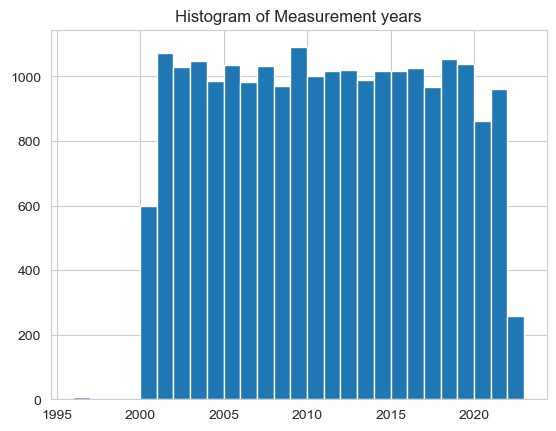

In [59]:
WP = pd.read_csv('../Data/WA_PLOT.csv')

WP['MEASYEAR'].info()
plt.hist(WP['MEASYEAR'],bins=27)
plt.title('Histogram of Measurement years')
plt.show()

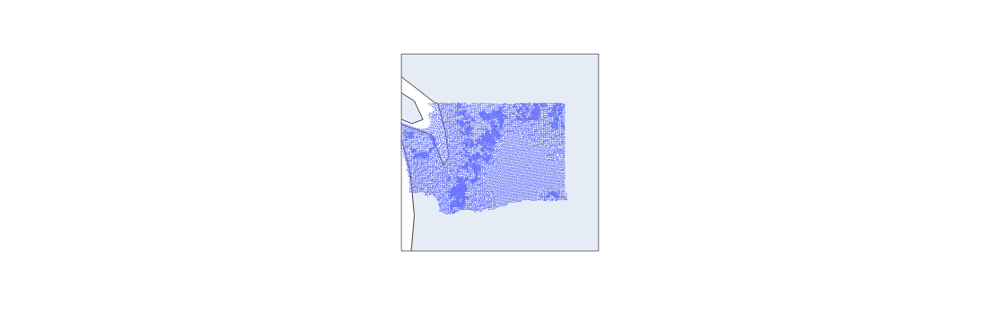

In [60]:

fig = px.scatter_geo(WP, lat='LAT', lon='LON',projection="mercator")

fig.update_traces(marker=dict(size=1))

fig.update_geos(
    center={"lat": 47.5, "lon": -120.0},  # Center around Washington State
    projection_scale=40  # Higher value zooms in more
)

fig.show()

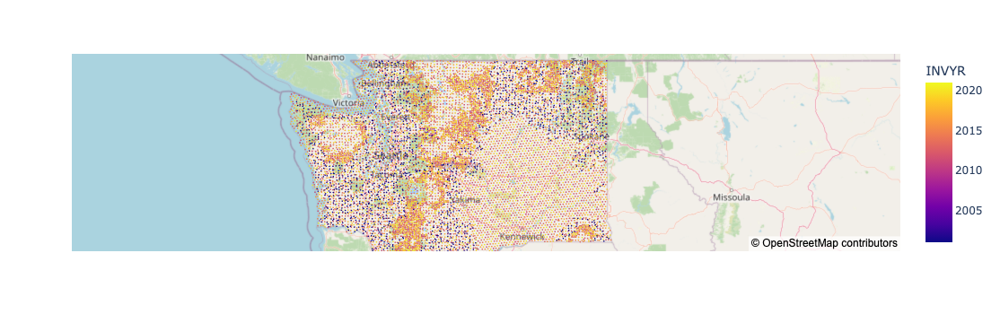

In [63]:
# let's look at plot of inventory year
fig = px.scatter_mapbox(WP, lat='LAT', lon='LON',color = "INVYR",zoom=5,mapbox_style="open-street-map")

fig.update_traces(marker = dict(size = 2))

fig.update_layout(
    mapbox_center={"lat": 47.5, "lon": -120.0},  # Center on Washington
)

fig.show()

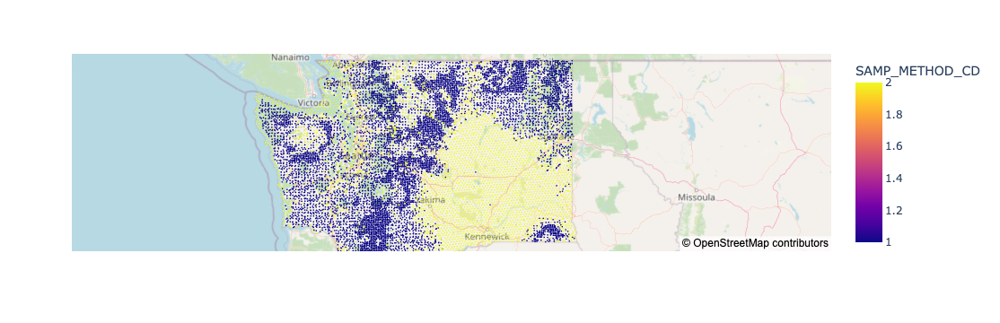

In [62]:
# Exploring whether the plots were remotely sampled
fig = px.scatter_mapbox(WP, lat='LAT', lon='LON',color = "SAMP_METHOD_CD",zoom=5,mapbox_style="open-street-map")

fig.update_traces(marker = dict(size = 2))

fig.update_layout(
    mapbox_center={"lat": 47.5, "lon": -120.0},  # Center on Washington
)

fig.show()

2 is remote sensing, 1 has been visited.  

Let's look at the data table with plot geometries to see how the plot numbers compare/ if they are unique.

### **WA_PLOTGEOM**

In [67]:
plot_geom = pd.read_csv('../Data/WA_PLOTGEOM.csv')

In [68]:
plot_geom = plot_geom.drop(columns=['CREATED_DATE', 'MODIFIED_DATE'])

In [69]:
plot_geom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20308 entries, 0 to 20307
Data columns (total 20 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   CN            20308 non-null  int64  
 1   STATECD       20308 non-null  float64
 2   INVYR         20308 non-null  float64
 3   UNITCD        20308 non-null  float64
 4   COUNTYCD      20308 non-null  float64
 5   PLOT          20308 non-null  float64
 6   LAT           20308 non-null  float64
 7   LON           20308 non-null  float64
 8   CONGCD        20308 non-null  float64
 9   ECOSUBCD      20308 non-null  object 
 10  HUC           20306 non-null  float64
 11  EMAP_HEX      20308 non-null  float64
 12  FIPSCOUNTY    20104 non-null  float64
 13  ROADLESSCD    2136 non-null   object 
 14  ALP_ADFORCD   8031 non-null   float64
 15  FVS_VARIANT   20298 non-null  object 
 16  FVS_LOC_CD    20298 non-null  float64
 17  FVS_REGION    20298 non-null  float64
 18  FVS_FOREST    20298 non-nu

In [70]:
plot_geom.sort_values(by = ['PLOT'])

,CN,STATECD,INVYR,UNITCD,COUNTYCD,PLOT,LAT,LON,CONGCD,ECOSUBCD,HUC,EMAP_HEX,FIPSCOUNTY,ROADLESSCD,ALP_ADFORCD,FVS_VARIANT,FVS_LOC_CD,FVS_REGION,FVS_FOREST,FVS_DISTRICT
18385,714229426290487,53.0,2020.0,5.0,61.0,9741.0,47.887899,-121.466592,5308.0,M242Db,17110009.0,26074.0,53061.0,1B,NaN,WC,613.0,6.0,13.0,NaN
19225,714229438290487,53.0,2020.0,9.0,65.0,13103.0,48.967794,-117.956265,5305.0,M333Ae,17020001.0,24755.0,53065.0,NaN,NaN,EC,621.0,6.0,21.0,NaN
19173,714229428290487,53.0,2020.0,9.0,51.0,35610.0,48.261460,-117.097459,5305.0,M333Aa,17010216.0,24379.0,53051.0,NaN,NaN,IE,113.0,1.0,13.0,NaN
18689,714229442290487,53.0,2020.0,8.0,7.0,43456.0,48.170244,-120.566502,5308.0,M242Dg,17020009.0,25726.0,53007.0,1B,617.0,EC,617.0,6.0,17.0,NaN
15970,412221491489998,53.0,2017.0,9.0,19.0,50002.0,48.009997,-118.506956,5305.0,M333Ae,17020001.0,25007.0,53019.0,NaN,NaN,EC,608.0,6.0,8.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5595,22955998010497,53.0,2007.0,8.0,39.0,99995.0,45.886524,-120.872634,5304.0,342Ig,17070106.0,25967.0,53039.0,NaN,NaN,EC,613.0,6.0,13.0,NaN
4110,22399248010497,53.0,2006.0,5.0,57.0,99997.0,48.574878,-121.556779,5302.0,M242Da,17110005.0,26071.0,53057.0,1B,605.0,WC,605.0,6.0,5.0,NaN
14269,346864417489998,53.0,2016.0,5.0,57.0,99997.0,48.574878,-121.556779,5302.0,M242Da,17110005.0,26071.0,53057.0,1B,605.0,WC,605.0,6.0,5.0,NaN
4720,8647102010901,53.0,2006.0,8.0,77.0,99999.0,46.418657,-119.941069,5304.0,342Ig,17030003.0,25616.0,53077.0,NaN,NaN,EC,617.0,6.0,17.0,NaN


We can see from above that rows 4720 and 14883 are the same plot # and location, the measurements/samples are just taken 10 years apart. Let's try dropping duplicates in PLOT# and maybe plot it and see what happens?? 

In [71]:
plot_geom_copy = plot_geom.copy()


In [72]:
single_lon = plot_geom_copy.drop_duplicates(subset=['LON'])
single_lon.sort_values(by = ['PLOT'])

,CN,STATECD,INVYR,UNITCD,COUNTYCD,PLOT,LAT,LON,CONGCD,ECOSUBCD,HUC,EMAP_HEX,FIPSCOUNTY,ROADLESSCD,ALP_ADFORCD,FVS_VARIANT,FVS_LOC_CD,FVS_REGION,FVS_FOREST,FVS_DISTRICT
18385,714229426290487,53.0,2020.0,5.0,61.0,9741.0,47.887899,-121.466592,5308.0,M242Db,17110009.0,26074.0,53061.0,1B,NaN,WC,613.0,6.0,13.0,NaN
19225,714229438290487,53.0,2020.0,9.0,65.0,13103.0,48.967794,-117.956265,5305.0,M333Ae,17020001.0,24755.0,53065.0,NaN,NaN,EC,621.0,6.0,21.0,NaN
19173,714229428290487,53.0,2020.0,9.0,51.0,35610.0,48.261460,-117.097459,5305.0,M333Aa,17010216.0,24379.0,53051.0,NaN,NaN,IE,113.0,1.0,13.0,NaN
18689,714229442290487,53.0,2020.0,8.0,7.0,43456.0,48.170244,-120.566502,5308.0,M242Dg,17020009.0,25726.0,53007.0,1B,617.0,EC,617.0,6.0,17.0,NaN
5807,22954698010497,53.0,2007.0,9.0,19.0,50002.0,48.009997,-118.506956,5305.0,M333Ae,17020001.0,25007.0,53019.0,NaN,NaN,EC,608.0,6.0,8.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
472,24123058010900,53.0,2002.0,8.0,7.0,99993.0,47.801631,-120.984707,5308.0,M242Db,17020011.0,25959.0,53007.0,1B,617.0,EC,617.0,6.0,17.0,NaN
5297,22956187010497,53.0,2007.0,6.0,31.0,99994.0,47.678942,-123.305667,5306.0,M242Ai,17110018.0,26740.0,53031.0,NaN,NaN,PN,609.0,6.0,9.0,NaN
5595,22955998010497,53.0,2007.0,8.0,39.0,99995.0,45.886524,-120.872634,5304.0,342Ig,17070106.0,25967.0,53039.0,NaN,NaN,EC,613.0,6.0,13.0,NaN
4110,22399248010497,53.0,2006.0,5.0,57.0,99997.0,48.574878,-121.556779,5302.0,M242Da,17110005.0,26071.0,53057.0,1B,605.0,WC,605.0,6.0,5.0,NaN


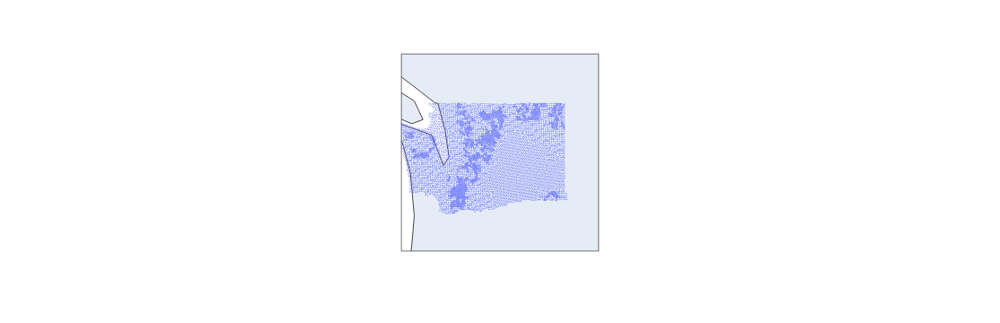

In [73]:
fig = px.scatter_geo(single_lon, lat='LAT', lon='LON',projection="mercator")

fig.update_traces(marker=dict(size=1))

fig.update_geos(
    center={"lat": 47.5, "lon": -120.0},  # Center around Washington State
    projection_scale=40  # Higher value zooms in more
)

fig.show()

In [74]:
#try dropping duplicate plot numbers

no_duplicate_plot_nums = plot_geom_copy.drop_duplicates(subset = ['PLOT'])
no_duplicate_plot_nums.sort_values(by = ['PLOT'])

,CN,STATECD,INVYR,UNITCD,COUNTYCD,PLOT,LAT,LON,CONGCD,ECOSUBCD,HUC,EMAP_HEX,FIPSCOUNTY,ROADLESSCD,ALP_ADFORCD,FVS_VARIANT,FVS_LOC_CD,FVS_REGION,FVS_FOREST,FVS_DISTRICT
18385,714229426290487,53.0,2020.0,5.0,61.0,9741.0,47.887899,-121.466592,5308.0,M242Db,17110009.0,26074.0,53061.0,1B,NaN,WC,613.0,6.0,13.0,NaN
19225,714229438290487,53.0,2020.0,9.0,65.0,13103.0,48.967794,-117.956265,5305.0,M333Ae,17020001.0,24755.0,53065.0,NaN,NaN,EC,621.0,6.0,21.0,NaN
19173,714229428290487,53.0,2020.0,9.0,51.0,35610.0,48.261460,-117.097459,5305.0,M333Aa,17010216.0,24379.0,53051.0,NaN,NaN,IE,113.0,1.0,13.0,NaN
18689,714229442290487,53.0,2020.0,8.0,7.0,43456.0,48.170244,-120.566502,5308.0,M242Dg,17020009.0,25726.0,53007.0,1B,617.0,EC,617.0,6.0,17.0,NaN
5807,22954698010497,53.0,2007.0,9.0,19.0,50002.0,48.009997,-118.506956,5305.0,M333Ae,17020001.0,25007.0,53019.0,NaN,NaN,EC,608.0,6.0,8.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
472,24123058010900,53.0,2002.0,8.0,7.0,99993.0,47.801631,-120.984707,5308.0,M242Db,17020011.0,25959.0,53007.0,1B,617.0,EC,617.0,6.0,17.0,NaN
5297,22956187010497,53.0,2007.0,6.0,31.0,99994.0,47.678942,-123.305667,5306.0,M242Ai,17110018.0,26740.0,53031.0,NaN,NaN,PN,609.0,6.0,9.0,NaN
5595,22955998010497,53.0,2007.0,8.0,39.0,99995.0,45.886524,-120.872634,5304.0,342Ig,17070106.0,25967.0,53039.0,NaN,NaN,EC,613.0,6.0,13.0,NaN
4110,22399248010497,53.0,2006.0,5.0,57.0,99997.0,48.574878,-121.556779,5302.0,M242Da,17110005.0,26071.0,53057.0,1B,605.0,WC,605.0,6.0,5.0,NaN


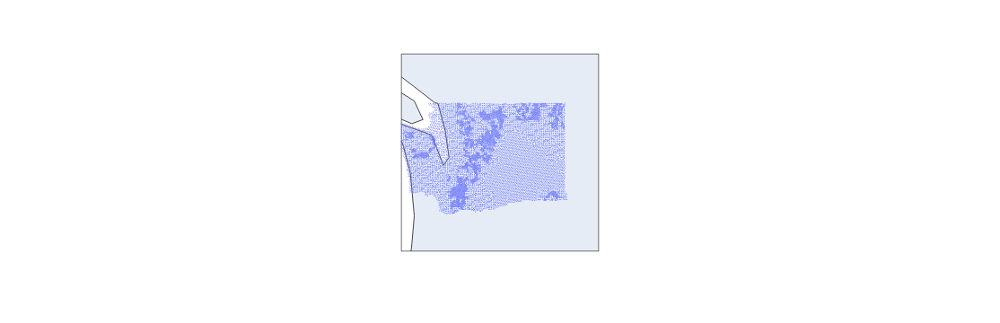

In [75]:
fig = px.scatter_geo(no_duplicate_plot_nums, lat='LAT', lon='LON',projection="mercator")

fig.update_traces(marker=dict(size=1))

fig.update_geos(
    center={"lat": 47.5, "lon": -120.0},  # Center around Washington State
    projection_scale=40  # Higher value zooms in more
)

fig.show()

In [76]:
print('Plot #97140, comes from County # 61:       ', plot_geom.loc[18387])

Plot #97140, comes from County # 61:        CN              714229402290487
STATECD                    53.0
INVYR                    2020.0
UNITCD                      5.0
COUNTYCD                   61.0
PLOT                    56260.0
LAT                   47.909149
LON                 -121.314297
CONGCD                   5308.0
ECOSUBCD                 M242Da
HUC                  17110009.0
EMAP_HEX                26073.0
FIPSCOUNTY              53061.0
ROADLESSCD                  NaN
ALP_ADFORCD               605.0
FVS_VARIANT                  WC
FVS_LOC_CD                613.0
FVS_REGION                  6.0
FVS_FOREST                 13.0
FVS_DISTRICT                NaN
Name: 18387, dtype: object


In [78]:
WP.sort_values(by = 'PLOT')
WP.loc[WP['PLOT'] == 9741]

,CN,SRV_CN,CTY_CN,PREV_PLT_CN,INVYR,STATECD,UNITCD,COUNTYCD,PLOT,PLOT_STATUS_CD,...,PAC_ISLAND_PNWRS,PLOT_SEASON_NERS,PRECIPITATION,PREV_MICROPLOT_LOC_RMRS,PREV_PLOT_STATUS_CD_RMRS,REUSECD1,REUSECD2,REUSECD3,GRND_LYR_SAMPLING_STATUS_CD,GRND_LYR_SAMPLING_METHOD_CD
15391,714229426290487,643410130126144,75010497,NaN,2020,53,5,61,9741,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


The CN # from WA_PLOTGEOM is 714229426290487 and the CN # from WA_PLOT is 714229426290487.. which are the same. Let's figure out where the plot is, likely using a scatter plot, but I have to think on this one. If it's in what we know to be a forested region, THEN we might be able to make some cross-refrences.

### Trying this with the WA Tree Dataset

First we're just looking for common PLOT #'s.. like the one I found and then maybe something good could come of it? 

In [80]:
trees_refined = wa_tree_data.drop_duplicates(subset = 'PLOT')

In [81]:
trees_refined.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6498 entries, 0 to 504535
Columns: 197 entries, CN to PREV_HT_FLD
dtypes: float64(180), int64(13), object(4)
memory usage: 9.8+ MB


In [82]:
#dropping unnecessary columns to make doing what I'm currently trying to achieve far easier. List of dropped columns in the next python cell. 
trees_refined = trees_refined.drop(columns=['PREVCOND', 'SPGRPCD', 'DIAHTCD', 'HTCD', 'ACTUALHT', 'TREECLCD', 'CCLCD', 'TREEGRCD', 'DIACHECK',
                            'SALVCD', 'UNCRCD', 'CPOSCD', 'CLIGHTCD', 'CVIGORCD', 'TREEHISTCD', 'CULLDEAD', 'CULLFORM', 'CULLMSTOP', 
                            'CULLBF', 'CULLCF', 'BFSND', 'CFSND', 'FORMCL', 'HTCALC', 'HTDMP', 'CYCLE', 'SUBCYCLE', 'VOLCSSND', 'DAMAGE_AGENT_CD1_SRS',
                            'DAMAGE_AGENT_CD2_SRS', 'DAMAGE_AGENT_CD3_SRS', 'CULL_BF_ROTTEN', 'CULL_BF_ROTTEN_CD', 'CULL_BF_ROUGH', 'CULL_BF_ROUGH_CD',
                            'P2A_GRM_FLG' ,'TREECLCD_31_NCRS', 'TREE_GRADE_NCRS', 'BOUGHS_AVAILABLE_NCRS', 'TREECLCD_31_NERS', 'AGENTCD_NERS', 
                            'BFSNDCD_NERS', 'AGECHKCD_RMRS', 'PREV_ACTUALHT_RMRS', 'PREV_AGECHKCD_RMRS', 'PREV_BHAGE_RMRS', 'PREV_HT_RMRS', 'PREV_TOTAGE_RMRS', 
                            'RADAGECD_RMRS', 'RADGRW_RMRS', 'VOLBSGRS', 'VOLBSNET', 'SAPLING_FUSIFORM_SRS'])

See https://research.fs.usda.gov/understory/forest-inventory-and-analysis-database-user-guide-nfi page 159 in browser, chapter 3-3 in pdf (not page numbered. Thanks USFS), for what each variable means. Many are related to data away from our region and are thus empty columns. Some are related but information we don't currently need and thus are eliminated for this purpose. When they may or may not be needed, then we can use them as needed. 
*Pro-tip when making significant data modification such as this one, make a copy of the dataset and work from that copy.*

In [83]:
trees_refined.info() #dropped off like 50 columns, dataset size is down to 10% of the original size. 

<class 'pandas.core.frame.DataFrame'>
Index: 6498 entries, 0 to 504535
Columns: 144 entries, CN to PREV_HT_FLD
dtypes: float64(130), int64(11), object(3)
memory usage: 7.2+ MB


In [84]:
#plot.sort_values(by = 'PLOT')
#plot.loc[plot['PLOT'] == 9741]

trees_refined.sort_values(by  = 'PLOT')
trees_refined.loc[trees_refined['PLOT'] == 9741]

,CN,PLT_CN,PREV_TRE_CN,INVYR,STATECD,UNITCD,COUNTYCD,PLOT,SUBP,TREE,...,VOLCSNET_BARK,DRYBIO_STEM,DRYBIO_STEM_BARK,DRYBIO_STUMP_BARK,DRYBIO_BOLE_BARK,DRYBIO_BRANCH,DRYBIO_FOLIAGE,DRYBIO_SAWLOG_BARK,PREV_ACTUALHT_FLD,PREV_HT_FLD
455654,850597537290487,714229426290487,NaN,2020,53,5,61,9741,3,1,...,NaN,14.998662,0.72335,NaN,NaN,7.192173,6.919683,NaN,NaN,NaN


### Conclusion for **WA_PLOT**:

The `PLT_CN` here is the SAME as the `PLT_CN` from the WA_PLOT dataset. Thus we should be able to link the location of each tree and plot# to get a location of the trees in this dataset. This is a little bit of data heavy-lifting.  

A potential algorithm for this, is to sort both and run a match between values in `PLOT_CN` or `PLOT` and throw out the rest. We can also then link LON and LAT here as well. The matter is sorting it & applying the additional columns to the tree_data set. It would be wise to clean off non-needed cloumns before appending to keep data sizes reasonable. 